<a href="https://colab.research.google.com/github/brl0/brl0-stuff/blob/master/stars.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from google.colab import drive
drive.mount('/gdrive')

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [0]:
!pip install cupy
import cupy as cp

In [0]:
!pip install ipympl

In [0]:
%matplotlib --list
%matplotlib inline
#%matplotlib ipympl
#%matplotlib widget
#%matplotlib notebook
#%matplotlib notebook

Available matplotlib backends: ['tk', 'gtk', 'gtk3', 'wx', 'qt4', 'qt5', 'qt', 'osx', 'nbagg', 'notebook', 'agg', 'inline', 'ipympl', 'widget']


In [0]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.style as mplstyle
mplstyle.use(['dark_background', 'ggplot', 'fast'])

In [0]:
import numpy as np
import pandas as pd
import seaborn as sns

In [0]:
from pathlib import Path
jpgs = sorted([*Path('/gdrive/My Drive/Google Photos/2016/04').glob("20160407*.*")])

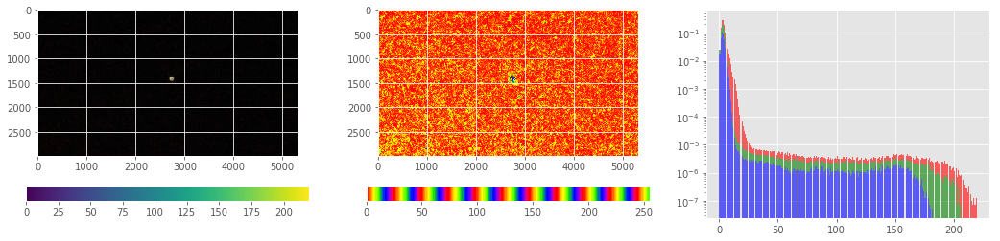

/usr/local/lib/python3.6/dist-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "
/usr/local/lib/python3.6/dist-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "
/usr/local/lib/python3.6/dist-packages/matplotlib/figure.py:98: MatplotlibDeprecationW

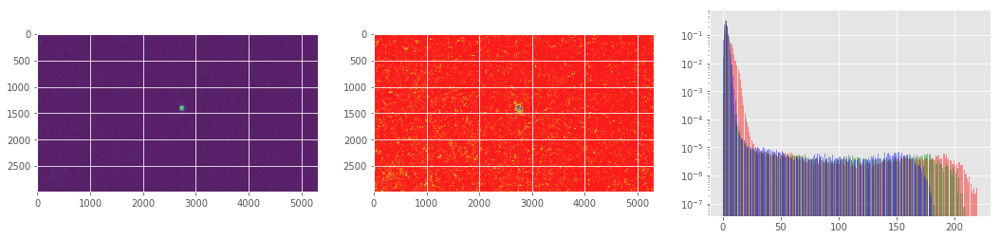

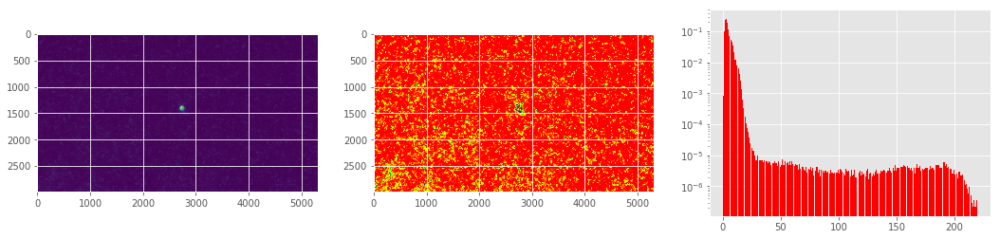

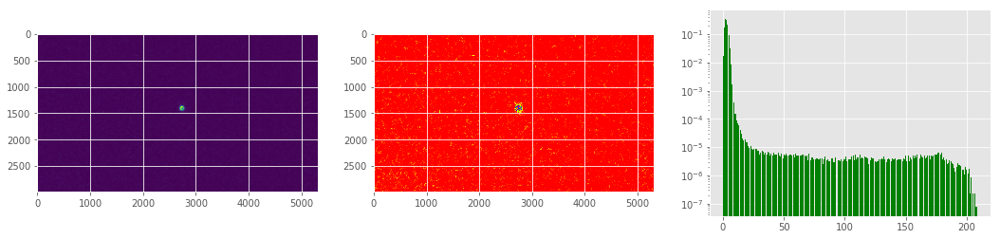

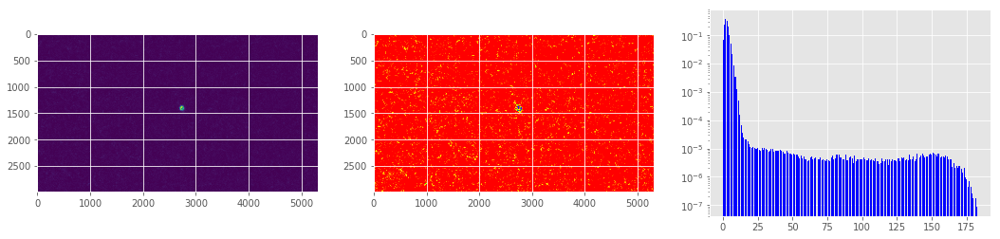

In [0]:
cmap = 'prism'
bins = 256
colors = ['b', 'g', 'r']
dim = (18,4)

jpg = jpgs[0]
img = plt.imread(jpg)
plt.figure(figsize=dim)
plt.subplot(1, 3, 1)
plt.imshow(img)
plt.colorbar(orientation='horizontal')
plt.subplot(1, 3, 2)
plt.imshow(np.mean(img, axis=2), cmap=cmap, clim=(0,255))
plt.colorbar(orientation='horizontal')
plt.subplot(1, 3, 3)
flat = [img[:, :, j].reshape(-1) for j in range(img.shape[2] - 1, -1, -1)]
plt.hist(flat, stacked=True, bins=bins, log=True, density=True, alpha=0.6, color=colors)
plt.show()

plt.figure(figsize=dim)
for i in range(img.shape[2]):
    layer = img[:,:,i:i+1]
    band = np.reshape(layer, layer.shape[0:2])
    plt.subplot(1, 3, 1)
    plt.imshow(band, alpha=0.5)
    plt.subplot(1, 3, 2)
    plt.imshow(band, cmap=cmap, clim=(np.median(img),255), alpha=0.5)
    plt.subplot(1, 3, 3)
    plt.hist(np.reshape(layer, (-1)), bins=bins, log=True, density=True, color=colors[::-1][i], alpha=0.4)
plt.show()

for i in range(img.shape[2]):
    layer = img[:,:,i:i+1]
    band = np.reshape(layer, layer.shape[0:2])
    plt.figure(figsize=dim)
    plt.subplot(1, 3, 1)
    plt.imshow(band)
    plt.subplot(1, 3, 2)
    plt.imshow(band, cmap=cmap, clim=(np.median(img),255))
    plt.subplot(1, 3, 3)
    plt.hist(np.reshape(layer, (-1)), bins=bins, log=True, density=True, color=colors[::-1][i])
    plt.show()

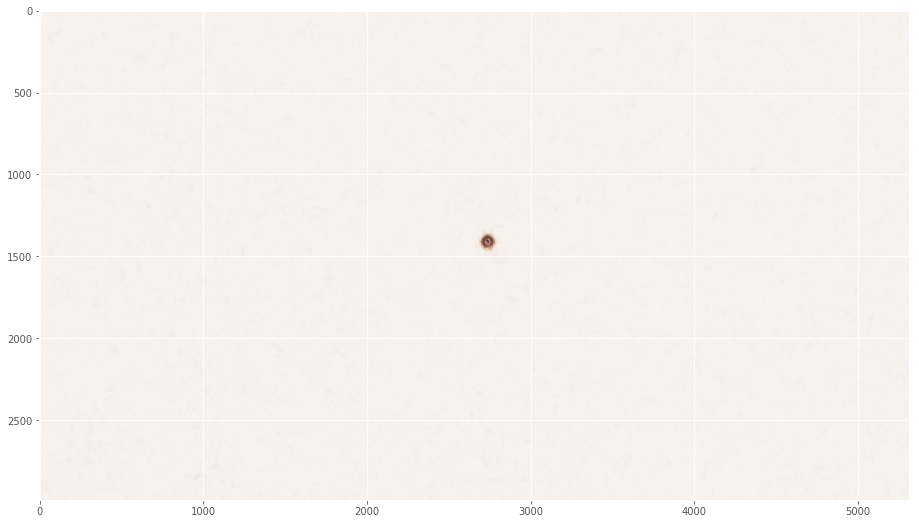

In [0]:
cmaps = ['Reds', 'Greens', 'Blues']
fig = plt.figure(figsize=(16,9))
for j in range(img.shape[2] - 1, -1, -1):
    plt.imshow(img[:, :, j], alpha=0.5, cmap=cmaps[j])
_ = plt.show()

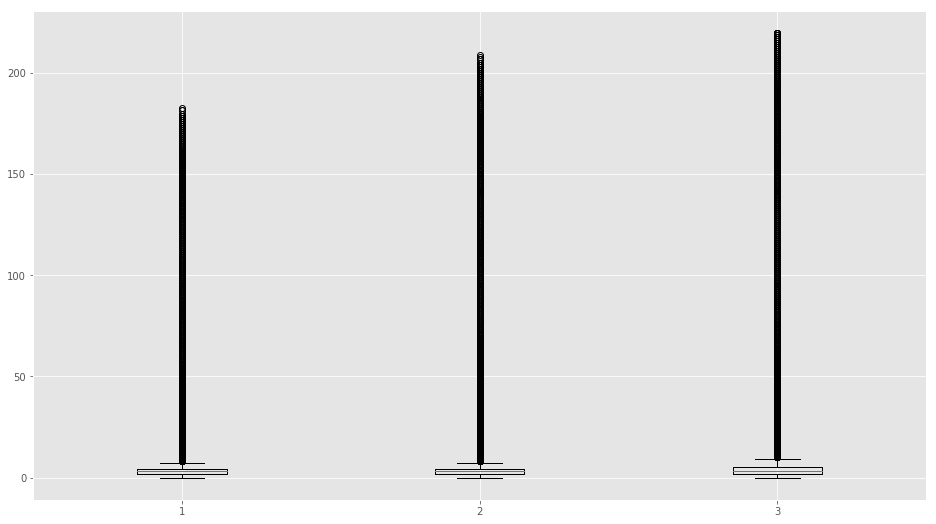

In [0]:
fig = plt.figure(figsize=(16,9))
_ = plt.boxplot(flat)
_ = plt.show()

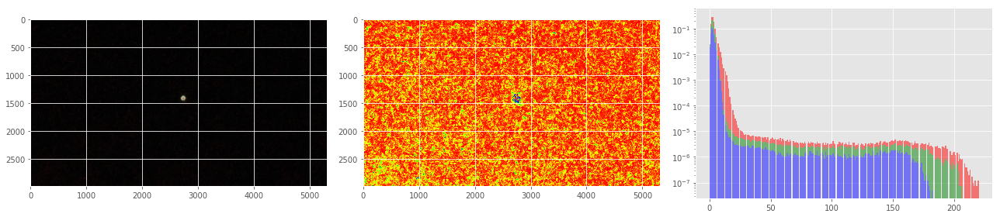

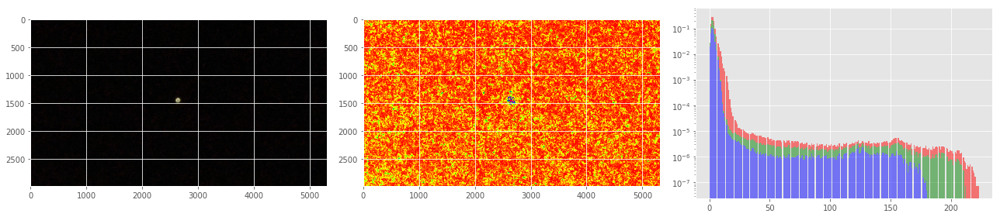

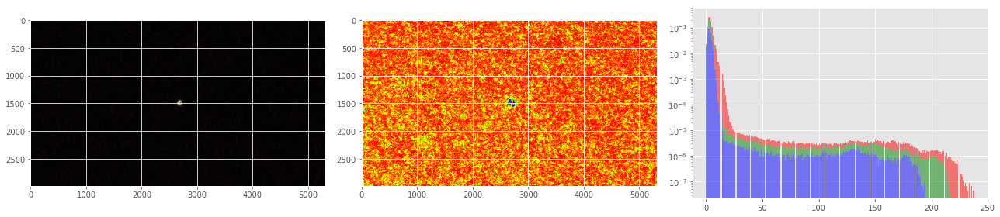

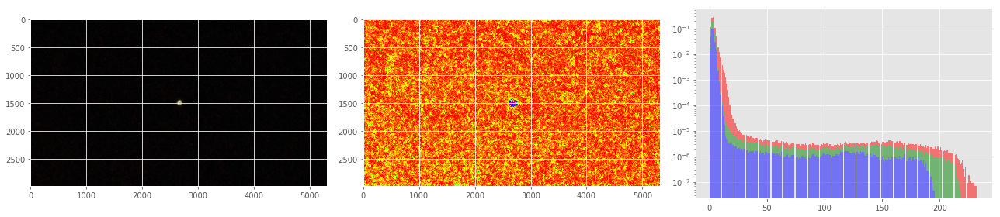

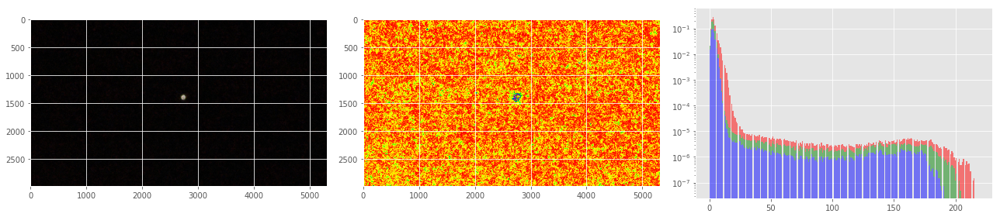

...

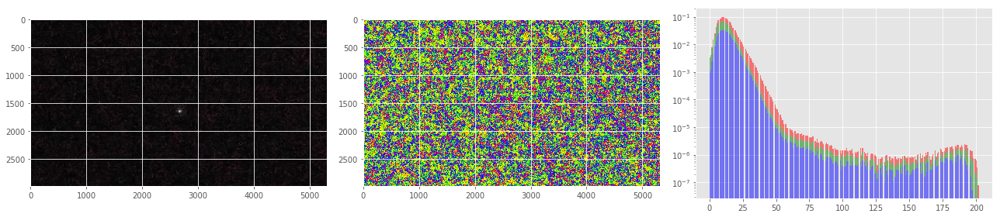

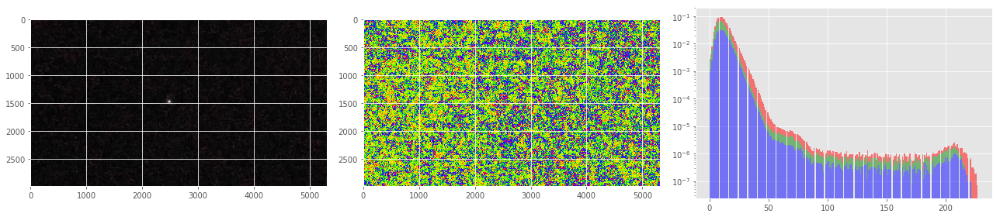

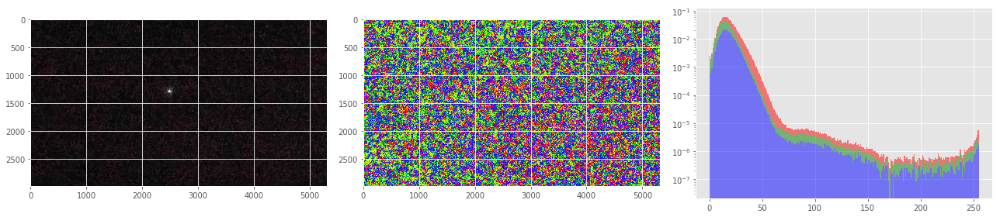

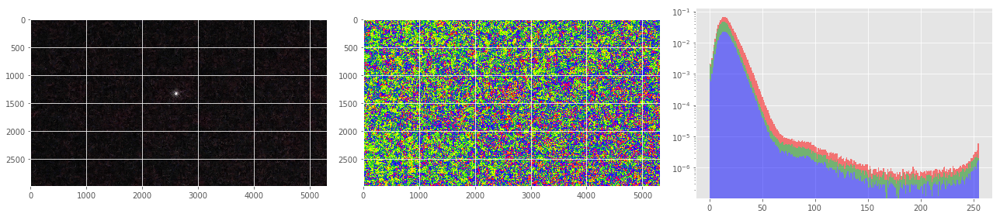

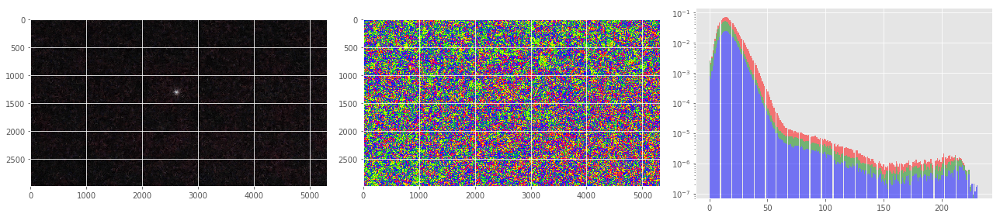

In [0]:
cmap = 'prism'
colors = ['b', 'g', 'r']
bins = 256
dim = (18,4)

for jpg in jpgs:
    img = plt.imread(jpg)
    fig, axes = plt.subplots(1, 3, figsize=dim, sharex=True, sharey=True)
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.subplot(1, 3, 2)
    plt.imshow(np.mean(img, axis=2), cmap=cmap)
    plt.subplot(1, 3, 3)
    flat = [img[:, :, j].reshape(-1) for j in range(img.shape[2] - 1, -1, -1)]
    plt.hist(flat, stacked=True, bins=bins, log=True, density=True, alpha=0.5, color=colors)
    plt.tight_layout()
    plt.show()

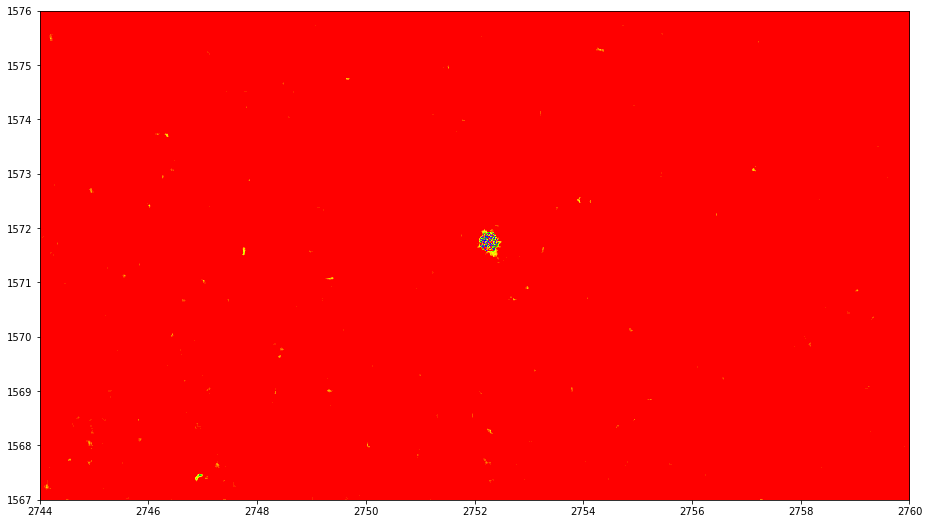

In [0]:
img_max = np.maximum(img[:,:,:1], img[:,:,1:2])
img_max = np.maximum(img_max, img[:,:,2:])
img_max = img_max.reshape(img_max.shape[0:2])
plt.figure(figsize=(16,9))
plt.imshow(img_max, clim=(14,255), extent=(2744, 2760, 1567, 1576), cmap=cmap)
plt.show()

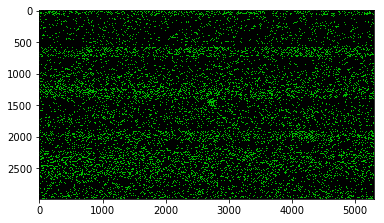

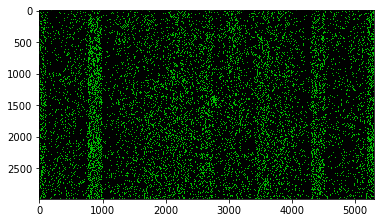

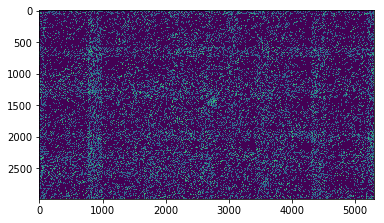

In [0]:
img_g = np.gradient(np.mean(img, 2))
plt.imshow(img_g[0], cmap='nipy_spectral')
plt.show()
plt.imshow(img_g[1], cmap='nipy_spectral')
plt.show()
plt.imshow(img_g[0] + img_g[1])

In [0]:
print(img.shape)
m2 = np.mean(img, axis=2)
print(m2.shape)
m0 = np.mean(m2, axis=0)
print(m0.shape)
print(m0.mean(), m0.max())
m1 = np.mean(m2, axis=1)
print(m1.shape)
print(m1.mean(), m1.max())

(2988, 5312, 3)
(2988, 5312)
(5312,)
3.323770630547625 8.237505577867104
(2988,)
3.323770630547626 5.819402610441767


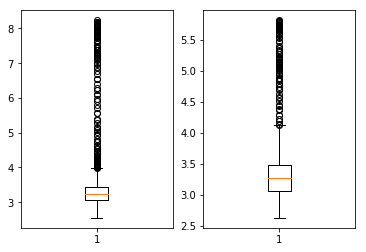

In [0]:
plt.subplot(121)
plt.boxplot(m0)
plt.subplot(122)
plt.boxplot(m1)
_ = plt.show()

1402 2721


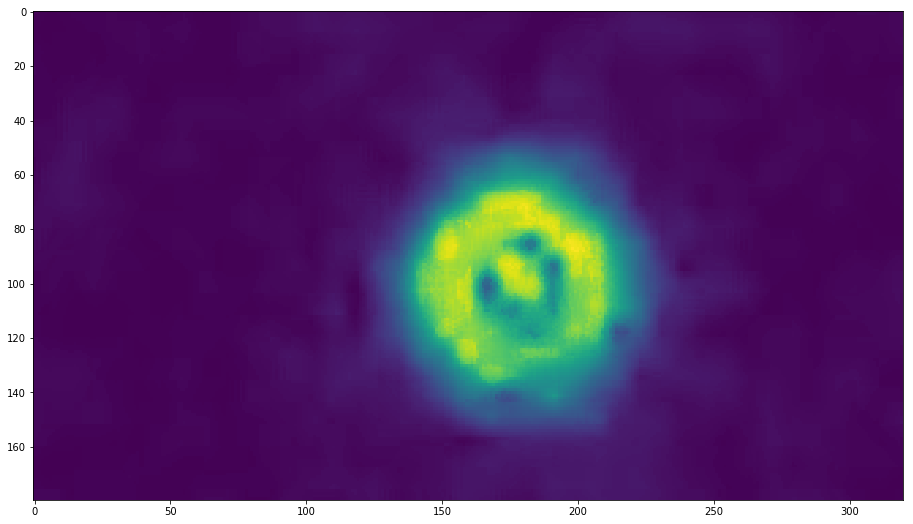

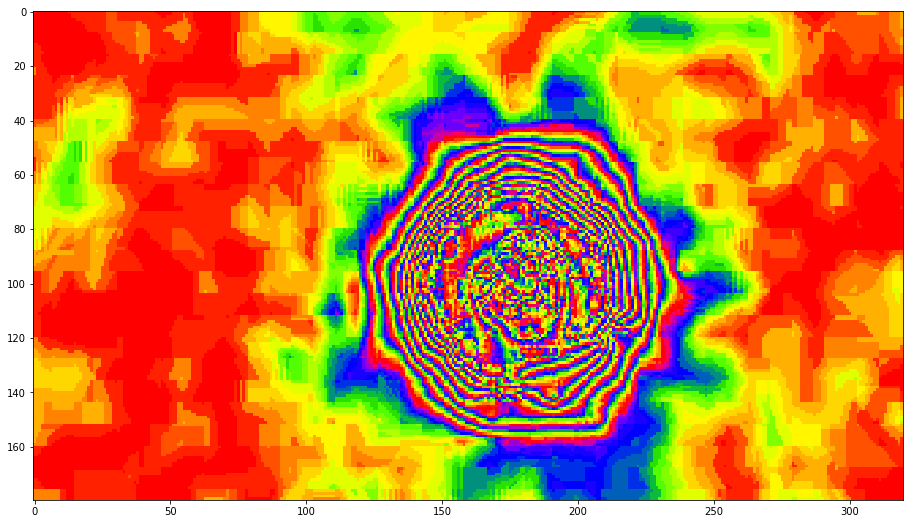

In [0]:
xrng, yrng = 90, 160
y0 = np.argmax(m0)
x0 = np.argmax(m1)
print(x0, y0)
star = m2[x0-xrng:x0+xrng, y0-yrng:y0+yrng]
plt.figure(figsize=(16,9))
_ = plt.imshow(star)
_ = plt.show()
plt.figure(figsize=(16,9))
_ = plt.imshow(star, cmap=cmap)
_ = plt.show()

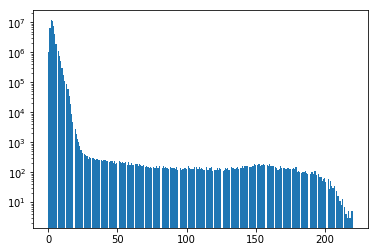

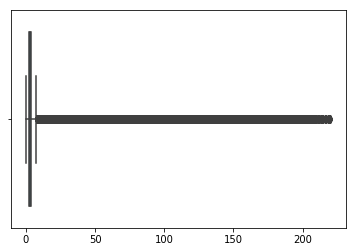

,0
count,4.761677e+07
mean,3.323771e+00
std,3.421676e+00
min,0.000000e+00
25%,2.000000e+00
50%,3.000000e+00
75%,4.000000e+00
max,2.200000e+02


In [0]:
_ = plt.hist(img.reshape(-1), bins=255, log=True)
_ = plt.show()
sns.boxplot(img.reshape(-1))
_ = plt.show()
pd.DataFrame(img.reshape(-1)).describe()

In [0]:
from sklearn.cluster import KMeans
model = KMeans(n_clusters=3)
model.fit(m2)
mc = model.cluster_centers_
mc.shape

(3, 5312)

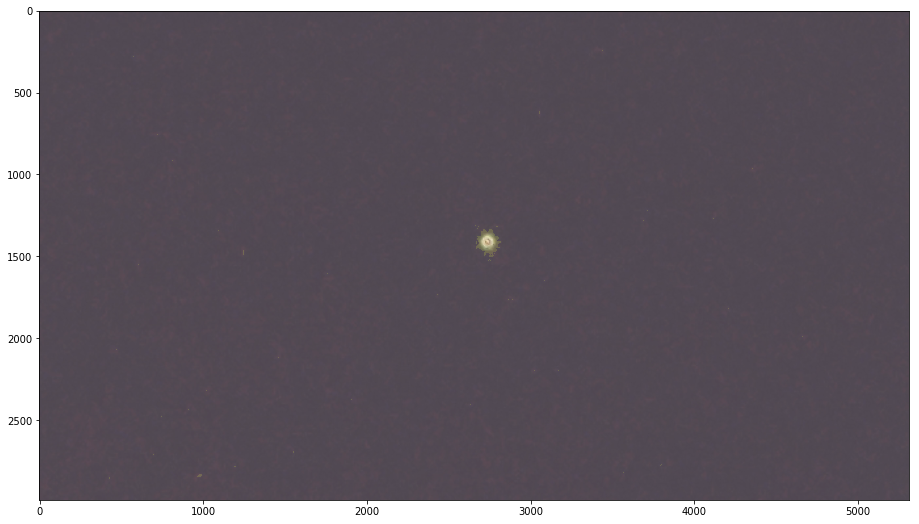

In [0]:
bg = np.sum(img[:,:,1:], axis=2)
top = np.percentile(bg, [99.9])
top_bg = np.clip(bg, top - 1, top) - (top - 1)
plt.figure(figsize=(16,9))
plt.imshow(top_bg, alpha=0.3)
plt.imshow(img, alpha=0.6)
_ = plt.show()

In [0]:
str(jpg)

'/gdrive/My Drive/Google Photos/2016/04/20160407_205536.jpg'

In [0]:
for jpg in jpgs:
    print(plt.imread(jpg).shape)

(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)
(2988, 5312, 3)


In [0]:
from sklearn.decomposition import NMF
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import FunctionTransformer

def get_image(img):
    return np.mean(plt.imread(img), axis=2).reshape(-1)

samples = np.array([get_image(jpg) for jpg in jpgs[:3]])

model = NMF(n_components=5)
features = model.fit_transform(samples)

for component in model.components_:
    _ = plt.imshow(component.reshape(2988, 5312))
    _ = plt.show()

IndexError: ignored

In [0]:
import keras

Using TensorFlow backend.
